In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
from astropy.io import fits

In [3]:
from astropy.table import Table

t = Table.read('davidfiles/plane_gaiadr2_dust_apogee_7-28.txt',format='ascii')
nuv=t['nuv'].data
ebv=t['ebv'].data #ebv3d

#t = Table.read('davidfiles/gais_gaiadr2_apogee_dust_7-29.txt',format='ascii')
#nuv=t['mag_nuv'].data
#  ebv=t['ebv3d'].data

In [4]:
print(t.columns)

<TableColumns names=('solution_id','source_id','ra_gaia','ra_error','dec_gaia','dec_error','parallax','parallax_error','pmra','pmdec','visibility_periods_used','duplicated_source','phot_g_mean_flux','phot_g_mean_flux_error','phot_g_mean_mag','phot_bp_mean_flux','phot_bp_mean_flux_error','phot_bp_mean_mag','phot_rp_mean_flux','phot_rp_mean_flux_error','phot_rp_mean_mag','radial_velocity','radial_velocity_error','rv_template_teff','rv_template_logg','rv_template_fe_h','phot_variable_flag','teff_val','flame_flags','angsep','number_plane','NUMBER','X_IMAGE','Y_IMAGE','ra_plane','dec_plane','FLUX_AUTO','FLUXERR_AUTO','FLUX_APER','A_IMAGE','B_IMAGE','THETA_IMAGE','FWHM_IMAGE','nuv','gl','gb','expsum','ctsum','bkgdsum','dist','distmod','ebv','APSTAR_ID','TARGET_ID','ASPCAP_ID','FILE','APOGEE_ID','TELESCOPE','LOCATION_ID','FIELD','J','J_ERR','H','H_ERR','K','K_ERR','RA','DEC','GLON','GLAT','MIN_H','MAX_H','MIN_JK','MAX_JK','TEFF','TEFF_ERR','LOGG','LOGG_ERR','VMICRO','VMACRO','VSINI','M_H','M_

In [5]:
print(nuv)

[15.28199959 13.82619953 14.23600006 ... 18.50569916 19.0468998
 15.66129971]


       LOGG       
------------------
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
               ...
2.7577712535858154
2.8294284343719482
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
           -9999.0
3.2246005535125732
2.4157931804656982
           -9999.0
Length = 6831 rows


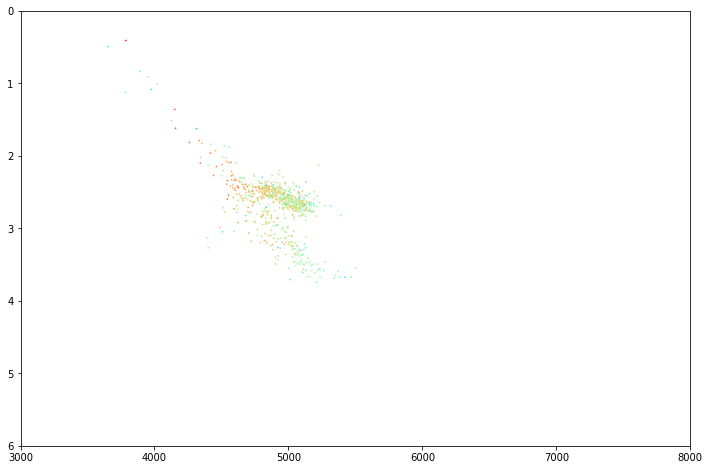

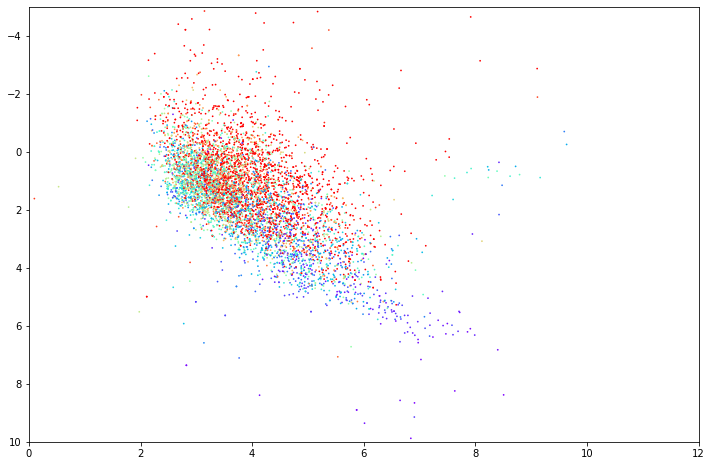

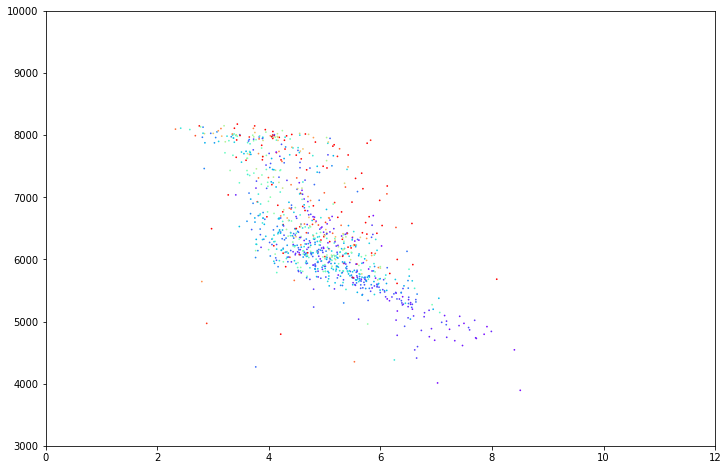

In [6]:

alph=1

p=np.where((t['LOGG'].data > 4) | (t['LOGG'].data < 0))
plt.figure(figsize=(4*3,4*2))
plt.xlim(3000,8000) 
plt.ylim(6 ,0)
x=t['TEFF'].data
y=t['LOGG'].data
colors=nuv-t['phot_g_mean_mag'].data
sc=plt.scatter(x,y,c=colors,cmap='rainbow',alpha=alph,marker='o',lw=0,s=3,vmin=0,vmax=12) 

plt.figure(figsize=(4*3,4*2))
plt.xlim(0,12) 
plt.ylim(10,-5)
x=nuv-t['phot_g_mean_mag'].data
y=t['phot_g_mean_mag'].data-t['distmod'].data
colors=ebv
sc=plt.scatter(x[p],y[p],c=colors[p],cmap='rainbow',alpha=alph,marker='o',lw=0,s=3,vmin=0,vmax=0.4) 

plt.figure(figsize=(4*3,4*2))
plt.xlim(0,12) 
plt.ylim(3000,10000)
#plt.ylim(2,15) #J
#plt.ylim(-1,1)
x=nuv-t['phot_g_mean_mag'].data
y=t['TEFF'].data
colors=ebv
sc=plt.scatter(x[p],y[p],c=colors[p],cmap='rainbow',alpha=alph,marker='o',lw=0,s=3,vmin=0,vmax=0.4) 
print(t['LOGG'])

In [7]:
hdu=fits.open('/Scratch/UVGAPS/Data_Sep_2019/plane_gaiadr2_dust_06_12_19.fits')
gaiaASC=hdu[1].data
print(gaiaASC.columns)

from astropy.coordinates import SkyCoord
from astropy import units as u
c = SkyCoord(ra=gaiaASC['ra_gaia']*u.degree, dec=gaiaASC['dec_gaia']*u.degree)  

ColDefs(
    name = 'solution_id'; format = 'K'
    name = 'source_id'; format = 'K'
    name = 'ra_gaia'; format = 'D'
    name = 'ra_error'; format = 'D'
    name = 'dec_gaia'; format = 'D'
    name = 'dec_error'; format = 'D'
    name = 'parallax'; format = 'D'
    name = 'parallax_error'; format = 'D'
    name = 'pmra'; format = 'D'
    name = 'pmdec'; format = 'D'
    name = 'visibility_periods_used'; format = 'I'
    name = 'duplicated_source'; format = 'L'
    name = 'phot_g_mean_flux'; format = 'D'
    name = 'phot_g_mean_flux_error'; format = 'D'
    name = 'phot_g_mean_mag'; format = 'D'
    name = 'phot_bp_mean_flux'; format = 'D'
    name = 'phot_bp_mean_flux_error'; format = 'D'
    name = 'phot_bp_mean_mag'; format = 'D'
    name = 'phot_rp_mean_flux'; format = 'D'
    name = 'phot_rp_mean_flux_error'; format = 'D'
    name = 'phot_rp_mean_mag'; format = 'D'
    name = 'radial_velocity'; format = 'D'
    name = 'radial_velocity_error'; format = 'D'
    name = 'rv_template

In [8]:
hdu=fits.open('/Scratch/UVGAPS/LMRCV1.fits')
lmrcv1=hdu[1].data
lmrcRA=lmrcv1['RA']
lmrcDEC=lmrcv1['DEC']
lmrcG=lmrcv1['G']
lmrcT=lmrcv1['TEFF']
lmrcFEH=lmrcv1['FEH']
lmrcMASS=lmrcv1['MASS']
lmrcAFE=lmrcv1['AFE']
lmrcAGE=lmrcv1['AGE']
lmrcEBV=lmrcv1['EBV']
lmrcBmR=lmrcv1['BP']-lmrcv1['RP']
lmrcdm=(5.0)*np.log10(1000.0/lmrcv1['PARALLAX'])-5.0
ptr=np.where(np.abs(lmrcv1['GLAT'])<10)
print(len(ptr[0]))
print(lmrcv1.columns)




51252
ColDefs(
    name = 'RA'; format = 'D'
    name = 'DEC'; format = 'D'
    name = 'GLON'; format = 'E'
    name = 'GLAT'; format = 'E'
    name = 'RV'; format = 'E'
    name = 'ERR_RV'; format = 'E'
    name = 'TEFF'; format = 'E'
    name = 'ERR_TEFF'; format = 'E'
    name = 'LOGG'; format = 'E'
    name = 'ERR_LOGG'; format = 'E'
    name = 'FEH'; format = 'E'
    name = 'ERR_FEH'; format = 'E'
    name = 'AFE'; format = 'E'
    name = 'ERR_AFE'; format = 'E'
    name = 'AGE'; format = 'E'
    name = 'ERR_AGE'; format = 'E'
    name = 'MASS'; format = 'E'
    name = 'ERR_MASS'; format = 'E'
    name = 'J'; format = 'E'
    name = 'ERR_J'; format = 'E'
    name = 'H'; format = 'E'
    name = 'ERR_H'; format = 'E'
    name = 'KS'; format = 'E'
    name = 'ERR_KS'; format = 'E'
    name = 'G'; format = 'E'
    name = 'ERR_G'; format = 'E'
    name = 'BP'; format = 'E'
    name = 'ERR_BP'; format = 'E'
    name = 'RP'; format = 'E'
    name = 'ERR_RP'; format = 'E'
    name = 'EBV'

<ipython-input-8-63dcf048abbf>:13: RuntimeWarning: divide by zero encountered in true_divide
  lmrcdm=(5.0)*np.log10(1000.0/lmrcv1['PARALLAX'])-5.0
<ipython-input-8-63dcf048abbf>:13: RuntimeWarning: invalid value encountered in log10
  lmrcdm=(5.0)*np.log10(1000.0/lmrcv1['PARALLAX'])-5.0


949


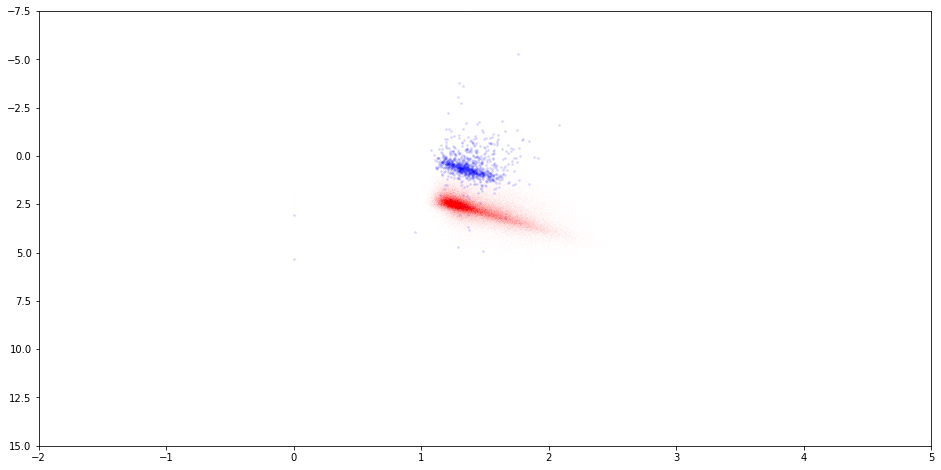

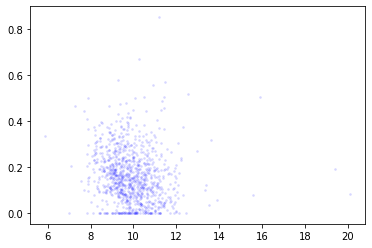

In [13]:
mnuv=gaiaASC['nuv']

lmrcCoord = SkyCoord(ra=lmrcv1['RA']*u.degree, dec=lmrcv1['DEC']*u.degree) 
idx1, d2d1, d3d1 = c.match_to_catalog_sky(lmrcCoord)
ptr=np.where(d2d1.arcsec<3)
print(len(ptr[0]))
uvg_lmrc=idx1[ptr]
plt.figure(figsize=(4*4,4*2))
plt.xlim(-2,5) 
plt.ylim(15,-7.5)

lmrcNmG=mnuv[ptr]-lmrcG[uvg_lmrc]


sc=plt.scatter(lmrcBmR,2+lmrcG-lmrcdm,marker='o',alpha=0.003,s=1,color='red')
sc=plt.scatter(lmrcBmR[uvg_lmrc],lmrcG[uvg_lmrc]-lmrcdm[uvg_lmrc],marker='o',alpha=0.1,s=3,color='blue')
plt.show()

#sc=plt.scatter(lmrcNmG,lmrcG[uvg_lmrc]-lmrcdm[uvg_lmrc],marker='o',alpha=0.1,s=3,color='blue')
sc=plt.scatter(lmrcdm[uvg_lmrc],lmrcEBV[uvg_lmrc],marker='o',alpha=0.1,s=3,color='blue')
#sc=plt.scatter(lmrcFEH,lmrcAFE,marker='o',alpha=0.01,s=3,color='red')
#sc=plt.scatter(lmrcFEH[uvg_lmrc],lmrcAFE[uvg_lmrc],marker='o',alpha=0.1,s=3,color='blue')
plt.show()



#print(d2d1[ptr].arcsec)

In [14]:
hdu=fits.open('/Scratch/UVGAPS/liu_2019_mw_clusters.fits')
liuMW=hdu[1].data
print(liuMW.columns)
liugl=liuMW['GLON']
liugb=liuMW['GLAT']
liuDiam=liuMW['rmax']*60*2
liuAge=liuMW['Age']
#bicaMWc = SkyCoord(ra=bicaMW['RAJ2000']*u.degree, dec=bicaMW['DEJ2000']*u.degree) 
#bicaDiam = bicaMW['Diam-a']
liuyoung=np.where((liuAge < 0.33))
liumed=np.where((liuAge >0.33) & (liuAge < 0.66))
liuold=np.where((liuAge >0.66))

ColDefs(
    name = 'ID'; format = 'I'; disp = 'I4'
    name = 'n_ID'; format = 'A'; disp = 'A1'
    name = 'GLON'; format = 'E'; unit = 'deg'; disp = 'F7.3'
    name = 'e_GLON'; format = 'E'; unit = 'deg'; disp = 'F6.3'
    name = 'GLAT'; format = 'E'; unit = 'deg'; disp = 'F7.3'
    name = 'e_GLAT'; format = 'E'; unit = 'deg'; disp = 'F6.3'
    name = 'rmax'; format = 'E'; unit = 'deg'; disp = 'F6.3'
    name = 'plx'; format = 'E'; unit = 'mas'; disp = 'F6.3'
    name = 'e_plx'; format = 'E'; unit = 'mas'; disp = 'F6.3'
    name = 'pmRA'; format = 'E'; unit = 'mas/yr'; disp = 'F7.3'
    name = 'e_pmRA'; format = 'E'; unit = 'mas/yr'; disp = 'F6.3'
    name = 'pmDE'; format = 'E'; unit = 'mas/yr'; disp = 'F7.3'
    name = 'e_pmDE'; format = 'E'; unit = 'mas/yr'; disp = 'F6.3'
    name = 'nTot'; format = 'I'; disp = 'I5'
    name = 'Age'; format = 'E'; unit = 'Gyr'; disp = 'F6.3'
    name = 'e_Age'; format = 'E'; unit = 'Gyr'; disp = 'F7.4'
    name = 'Z'; format = 'E'; unit = '[Sun]';

In [15]:
hdu=fits.open('/Scratch/UVGAPS/cantat-gaudin_2020_star_clusters.fits')
cgMW=hdu[1].data
print(cgMW.columns)
cggl=cgMW['GLON']
cggb=cgMW['GLAT']
cgr50=cgMW['r50']
cgDiam=cgMW['r50']*2.0*60
cgAge=cgMW['AgeNN']
cgnstars=cgMW['nbstars07']
#bicaMWc = SkyCoord(ra=bicaMW['RAJ2000']*u.degree, dec=bicaMW['DEJ2000']*u.degree) 
#bicaDiam = bicaMW['Diam-a']
cgyoung=np.where((cgAge < 8))
cgmed=np.where((cgAge >8.33) & (cgAge < 8.66))
cgold=np.where((cgAge >8.66))
print(cggl)
print(cggb)
print(cgDiam)

ColDefs(
    name = 'Cluster'; format = '17A'; disp = 'A17'
    name = 'RA_ICRS'; format = 'E'; unit = 'deg'; disp = 'F7.3'
    name = 'DE_ICRS'; format = 'E'; unit = 'deg'; disp = 'F7.3'
    name = 'GLON'; format = 'E'; unit = 'deg'; disp = 'F7.3'
    name = 'GLAT'; format = 'E'; unit = 'deg'; disp = 'F7.3'
    name = 'r50'; format = 'E'; unit = 'arcsec'; disp = 'F6.3'
    name = 'nbstars07'; format = 'I'; disp = 'I4'
    name = 'pmRA_'; format = 'E'; unit = 'mas/yr'; disp = 'F7.3'
    name = 'e_pmRA_'; format = 'E'; unit = 'mas/yr'; disp = 'F6.3'
    name = 'pmDE'; format = 'E'; unit = 'mas/yr'; disp = 'F7.3'
    name = 'e_pmDE'; format = 'E'; unit = 'mas/yr'; disp = 'F6.3'
    name = 'plx'; format = 'E'; unit = 'mas'; disp = 'F6.3'
    name = 'e_plx'; format = 'E'; unit = 'mas'; disp = 'F6.3'
    name = 'Flag'; format = '14A'; disp = 'A14'
    name = 'AgeNN'; format = 'E'; unit = '[yr]'; disp = 'F5.2'
    name = 'AVNN'; format = 'E'; unit = 'mag'; disp = 'F5.2'
    name = 'DMNN'; fo

<ipython-input-15-bef0a72ddf95>:12: RuntimeWarning: invalid value encountered in less
  cgyoung=np.where((cgAge < 8))
<ipython-input-15-bef0a72ddf95>:13: RuntimeWarning: invalid value encountered in greater
  cgmed=np.where((cgAge >8.33) & (cgAge < 8.66))
<ipython-input-15-bef0a72ddf95>:13: RuntimeWarning: invalid value encountered in less
  cgmed=np.where((cgAge >8.33) & (cgAge < 8.66))
<ipython-input-15-bef0a72ddf95>:14: RuntimeWarning: invalid value encountered in greater
  cgold=np.where((cgAge >8.66))


In [59]:
hdu=fits.open('/Scratch/UVGAPS/cantat-gaudin_2020_star_clusters_stars.fits')
cgsMW=hdu[1].data
print(cgsMW.columns)
cgsgl=cgsMW['GLON']
cgsgb=cgsMW['GLAT']
cgsra=cgsMW['RA_ICRS']
cgsde=cgsMW['DE_ICRS']
cgsdm=(5.0)*np.log10(1000.0/cgsMW['Plx'])-5.0
cgsG=cgsMW['Gmag']
cgsBmR=cgsMW['BP-RP']
cgscluster=cgsMW['Cluster']


cgsu, indices = np.unique(cgsMW['Cluster'], return_inverse=True)
agearr=np.zeros(len(cgsu))
distarr=np.zeros(len(cgsu))
stararr=np.zeros(len(cgsu))
i=0
for clust in cgsu:
    pcl=np.where(clust == cgMW['Cluster'])[0]
    agearr[i]=cgMW['AgeNN'][pcl[0]]
    distarr[i]=cgsdm[pcl[0]]
    stararr[i]=cgnstars[pcl[0]]
    i=i+1

#indices=np.flip(indices)

ageptr=np.argsort(agearr)
newidx=np.zeros(len(indices))
for i in np.arange(len(cgsu)):
        p=np.where(indices==ageptr[i])
        newidx[p]=i
        
xoff= np.mod(newidx,30)
yoff=(newidx-xoff)/30




ColDefs(
    name = 'RA_ICRS'; format = 'D'; unit = 'deg'; disp = 'F15.11'
    name = 'DE_ICRS'; format = 'D'; unit = 'deg'; disp = 'F15.11'
    name = 'GaiaDR2'; format = 'K'; disp = 'I19'
    name = 'GLON'; format = 'D'; unit = 'deg'; disp = 'D24.17'
    name = 'GLAT'; format = 'D'; unit = 'deg'; disp = 'D25.18'
    name = 'Plx'; format = 'D'; unit = 'mas'; disp = 'D24.17'
    name = 'pmRA_'; format = 'D'; unit = 'mas/yr'; disp = 'D25.18'
    name = 'pmDE'; format = 'D'; unit = 'mas/yr'; disp = 'D25.18'
    name = 'RV'; format = 'D'; unit = 'km/s'; disp = 'F24.19'
    name = 'o_Gmag'; format = 'I'; disp = 'I4'
    name = 'Gmag'; format = 'D'; unit = 'mag'; disp = 'F10.7'
    name = 'BP-RP'; format = 'D'; unit = 'mag'; disp = 'D16.9'
    name = 'proba'; format = 'D'; disp = 'F8.5'
    name = 'Cluster'; format = '17A'; disp = 'A17'
    name = 'Teff50'; format = 'D'; unit = 'K'; disp = 'F14.8'
    name = '_RA_icrs'; format = 'D'; unit = 'deg'; disp = 'F15.11'
    name = '_DE_icrs'; form

<ipython-input-59-01a877f02421>:8: RuntimeWarning: invalid value encountered in log10
  cgsdm=(5.0)*np.log10(1000.0/cgsMW['Plx'])-5.0


In [22]:
cgCoord = SkyCoord(ra=cgMW['RA_ICRS']*u.degree, dec=cgMW['DE_ICRS']*u.degree) 
idx1, d2d1, d3d1 = c.match_to_catalog_sky(cgCoord)
n_cgcl=len(cggl)
print(idx1)
print(n_cgcl,len(idx1))
for i in np.arange(n_cgcl):
    ptr=np.where((idx1 == i) & (d2d1.degree<(3*cgr50[i])))
    ptr2=np.where((idx1 == i) & (d2d1.degree<(10*cgr50[i])))
#    print(i,cgr50[i],len(gaiaASC['gl'][ptr]),len(gaiaASC['gl'][ptr2])/((10.0/3.0)**2),cgnstars[i])

[ 272  272  272 ... 1900 1900 1900]
2017 2475257


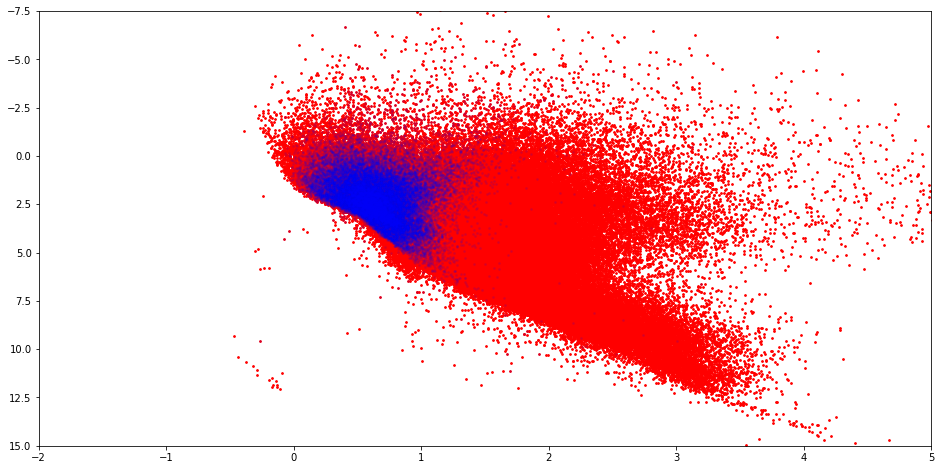

In [61]:
cgsCoord = SkyCoord(ra=cgsMW['RA_ICRS']*u.degree, dec=cgsMW['DE_ICRS']*u.degree) 
idx1, d2d1, d3d1 = c.match_to_catalog_sky(cgsCoord)
ptr=np.where(d2d1.arcsec<5)
uvg_cgs=np.unique(np.sort(idx1[ptr]))
plt.figure(figsize=(4*4,4*2))
plt.xlim(-2,5) 
plt.ylim(15,-7.5)

sc=plt.scatter(cgsBmR,cgsG-cgsdm,marker='o',alpha=1,s=3,color='red')
sc=plt.scatter(cgsBmR[uvg_cgs],cgsG[uvg_cgs]-cgsdm[uvg_cgs],marker='o',alpha=0.1,s=3,color='blue')
plt.show()



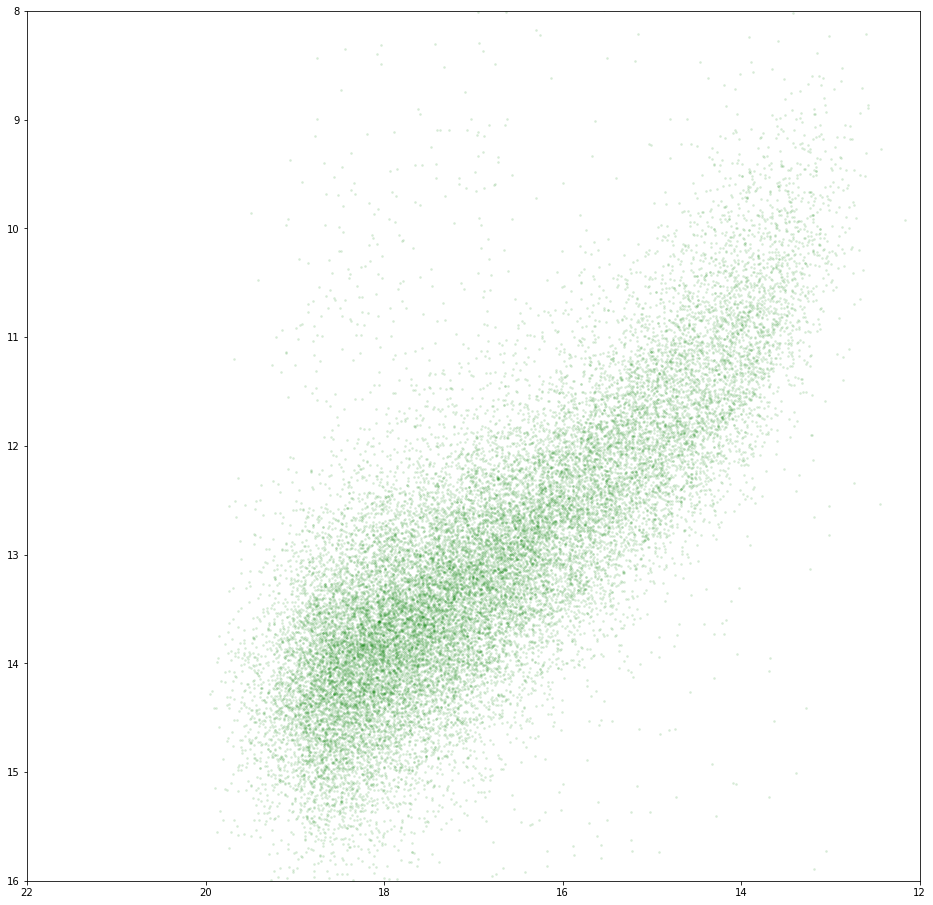

In [24]:
plt.figure(figsize=(4*4,4*4))
plt.xlim(-.5,2) 
plt.ylim(8,0)


#sc=plt.scatter(cgsBmR[idx1[ptr]],gaiaASC['nuv'][ptr]-cgsG[idx1[ptr]],marker='o',alpha=0.1,s=3,color='red')


plt.xlim(22,12) 
plt.ylim(16,8)


sc=plt.scatter(gaiaASC['nuv'][ptr],cgsG[idx1[ptr]],marker='o',alpha=0.1,s=3,color='green')



#sc=plt.scatter(cgsBmR[uvg_cgs],cgsG[uvg_cgs]-cgsdm[uvg_cgs],marker='o',alpha=1,s=3,color='blue')
plt.show()



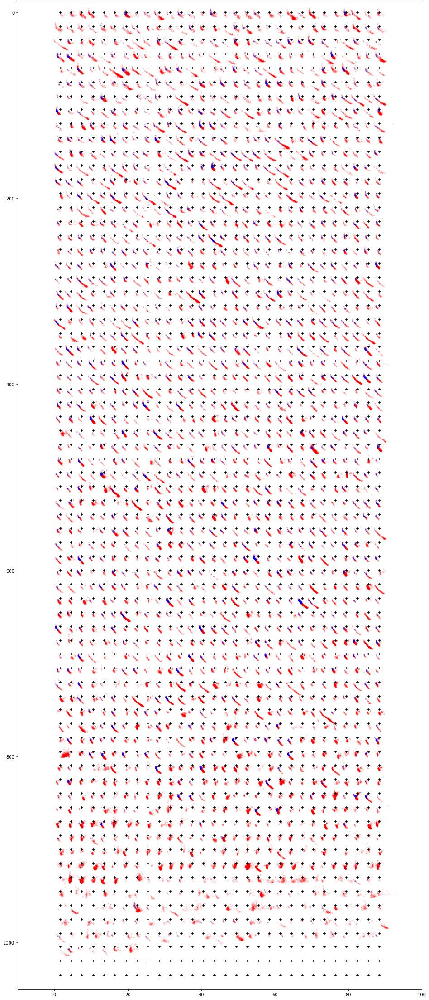

In [64]:
plt.figure(figsize=(4*4,4*10))
plt.xlim(-10,100) 
plt.ylim(1050,-10)

sc=plt.scatter(cgsBmR+xoff*3,(cgsG-cgsdm)+yoff*15,marker='.',alpha=0.1,s=10,color='red')
sc=plt.scatter(cgsBmR[uvg_cgs]+xoff[uvg_cgs]*3,(cgsG[uvg_cgs]-cgsdm[uvg_cgs])+yoff[uvg_cgs]*15,marker='.',alpha=0.1,s=10,color='blue')
xplt=np.zeros((30,70))
yplt=np.zeros((30,70))
for i in np.arange(30):
    for j in np.arange(70):
        xplt[i,j]=i+0.5
        yplt[i,j]=j
        
plt.scatter(xplt*3,yplt*15,marker='+',color='black')

#sc=plt.scatter(cgsBmR[uvg_cgs],cgsG[uvg_cgs]-cgsdm[uvg_cgs],marker='o',alpha=0.1,s=3,color='blue')
plt.show()




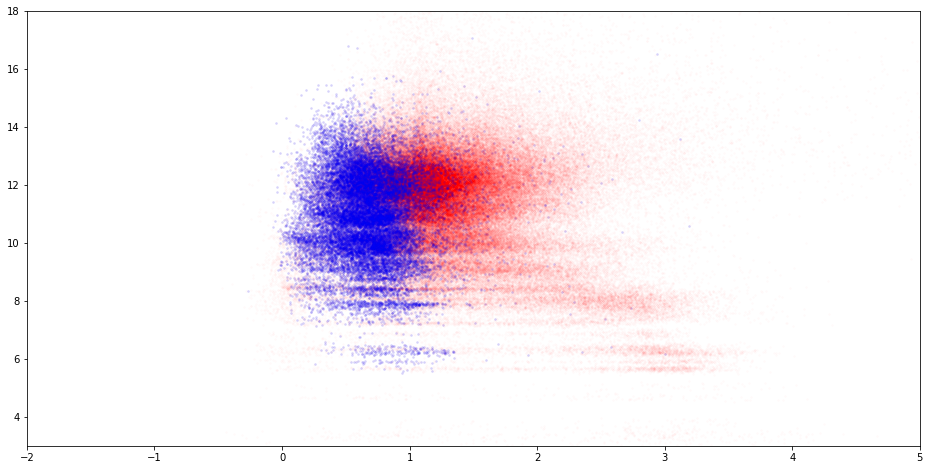

In [129]:
plt.figure(figsize=(4*4,4*2))
plt.xlim(-2,5) 
plt.ylim(3,18)
sc=plt.scatter(cgsBmR,cgsdm,marker='o',alpha=0.01,s=3,color='red')
sc=plt.scatter(cgsBmR[uvg_cgs],cgsdm[uvg_cgs],marker='o',alpha=0.1,s=3,color='blue')
plt.show()



In [18]:
hdu=fits.open('/Scratch/UVGAPS/bica_mw_clusters_2019.fits')
bicaMW=hdu[1].data
print(bicaMW.columns)
bicaMWc = SkyCoord(ra=bicaMW['RAJ2000']*u.degree, dec=bicaMW['DEJ2000']*u.degree) 
bicaDiam = bicaMW['Diam-a']

ColDefs(
    name = 'GLON'; format = 'E'; unit = 'deg'; disp = 'F6.2'
    name = 'GLAT'; format = 'E'; unit = 'deg'; disp = 'F6.2'
    name = 'RAJ2000'; format = 'D'; unit = 'deg'; disp = 'F8.3'
    name = 'DEJ2000'; format = 'D'; unit = 'deg'; disp = 'F9.4'
    name = 'Diam-a'; format = 'E'; unit = 'arcmin'; disp = 'F7.2'
    name = 'Diam-b'; format = 'E'; unit = 'arcmin'; disp = 'F7.2'
    name = 'Name'; format = '112A'; disp = 'A112'
    name = 'Class1'; format = '5A'; disp = 'A5'
    name = 'Class2'; format = '5A'; disp = 'A5'
    name = 'Com'; format = '32A'; disp = 'A32'
    name = 'Code'; format = '47A'; disp = 'A47'
    name = 'recno'; format = 'J'; disp = 'I8'
)


In [10]:
hist=np.histogram(gaiaASC['gl'],bins=3600)
d=np.zeros((3601))
d[:]=1.0
p=np.where(hist[0] > 50)

d[p]=0
xhist=10*d*np.cos(hist[1]*np.pi/180)
yhist=10*d*np.sin(hist[1]*np.pi/180)


In [26]:
print(gaiaASC.shape)
print(bicaMWc.galactic.l.degree)
print(np.median(bicaDiam))

(2475257,)
[2.73970530e-04 1.16648442e-02 2.03109951e-02 ... 3.59978571e+02
 3.59991370e+02 3.59994458e+02]
5.0


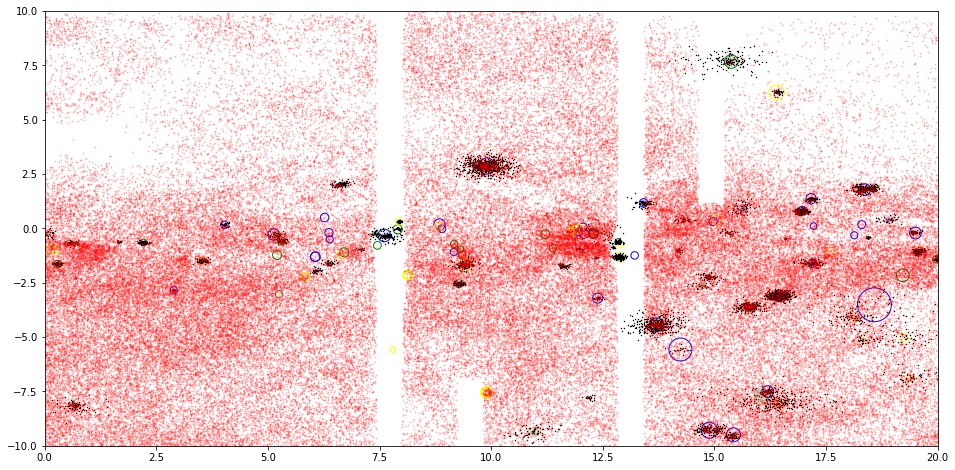

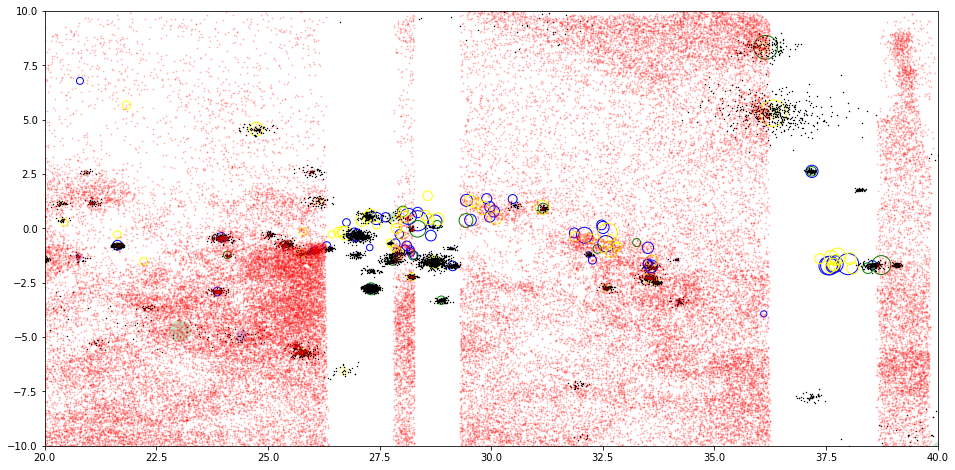

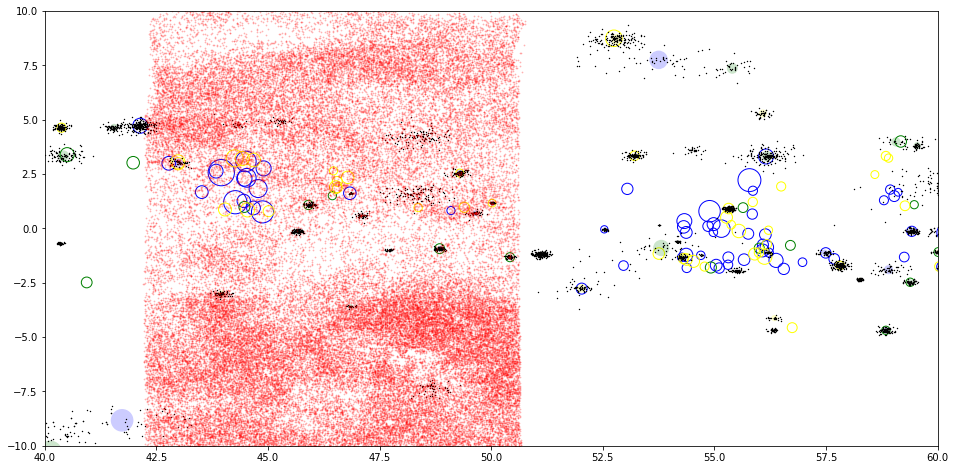

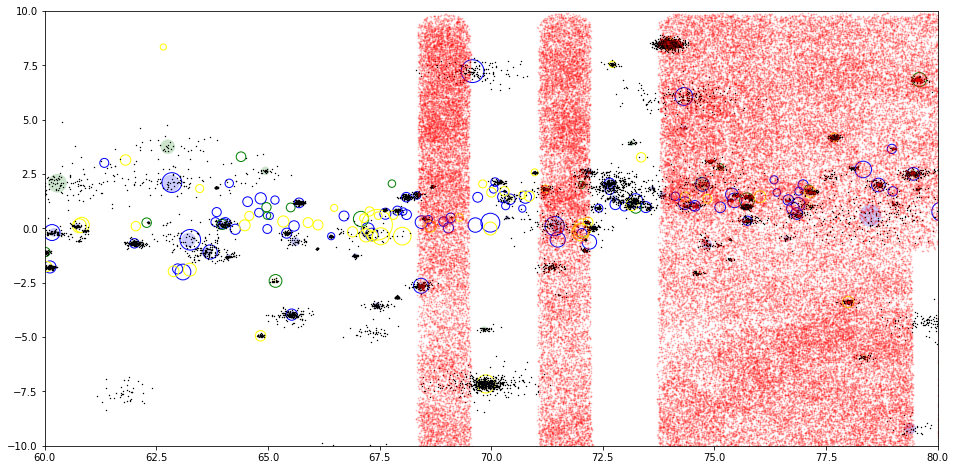

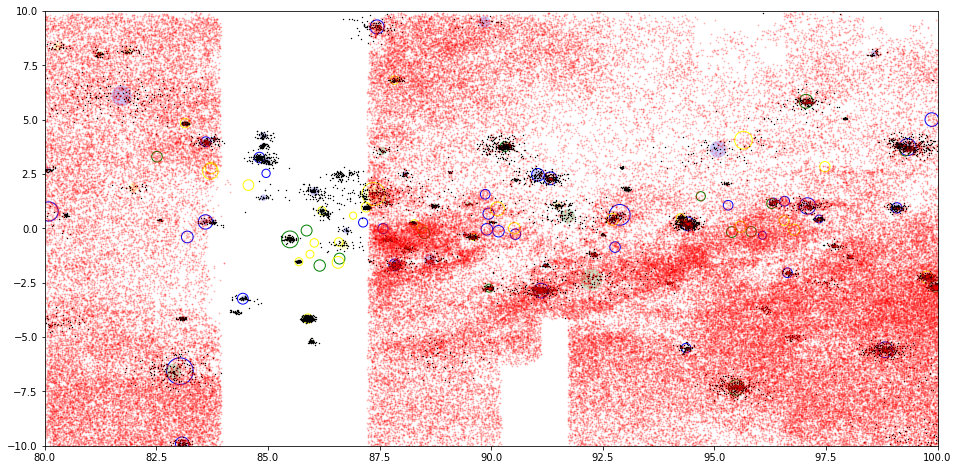

...

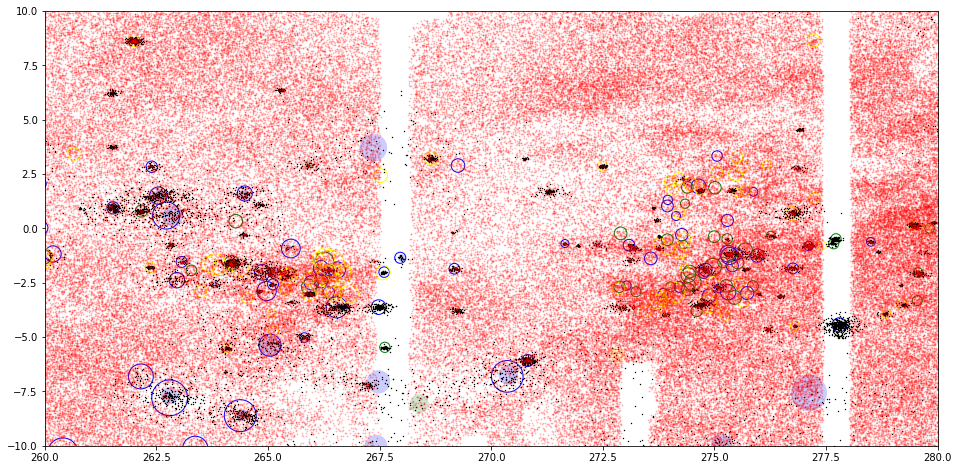

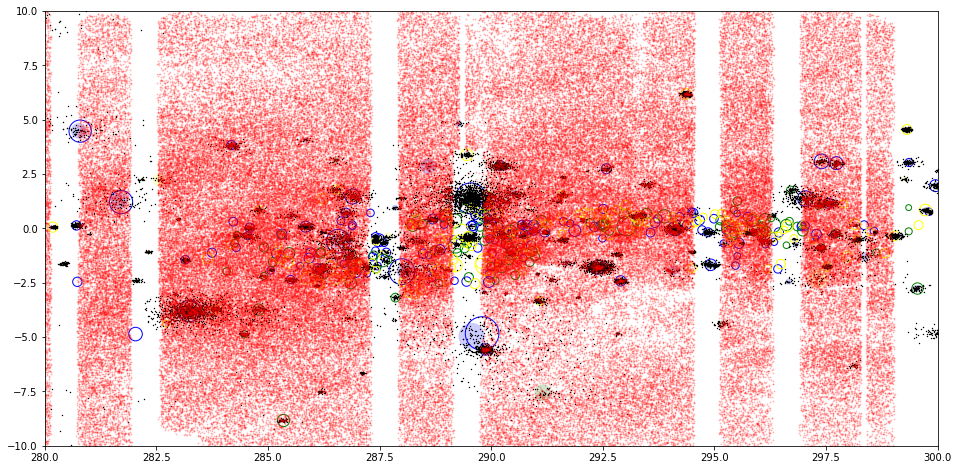

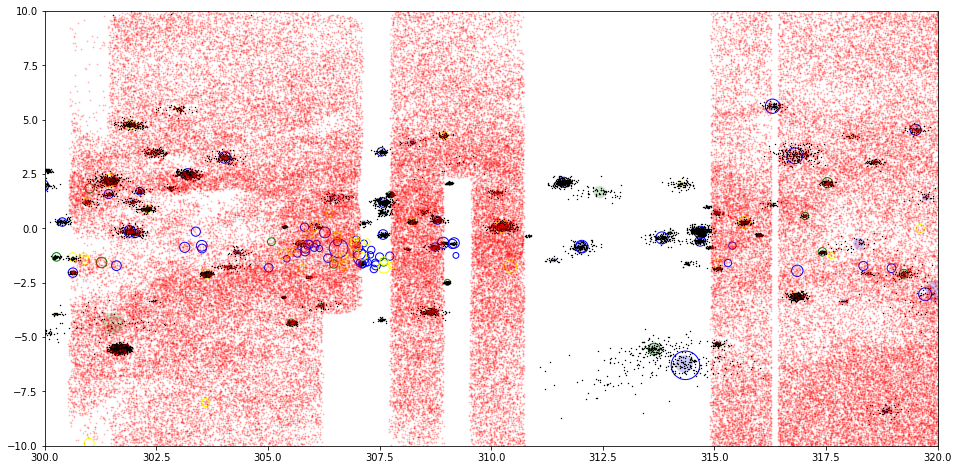

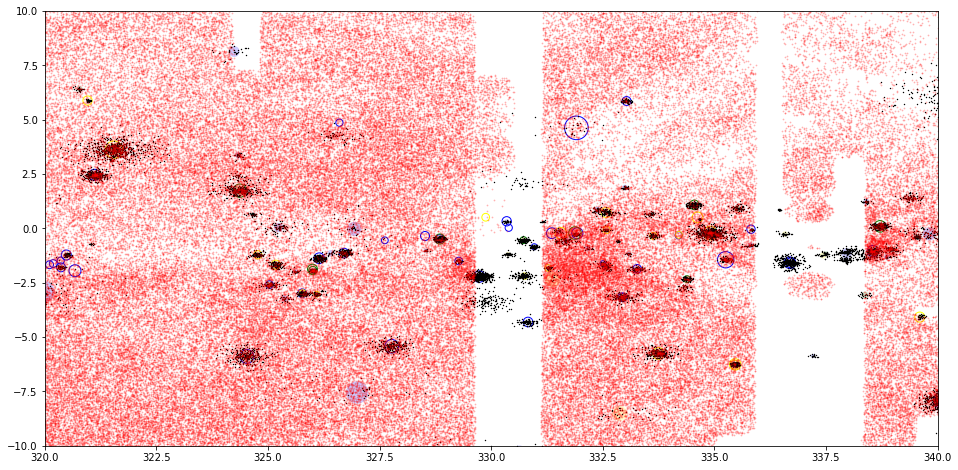

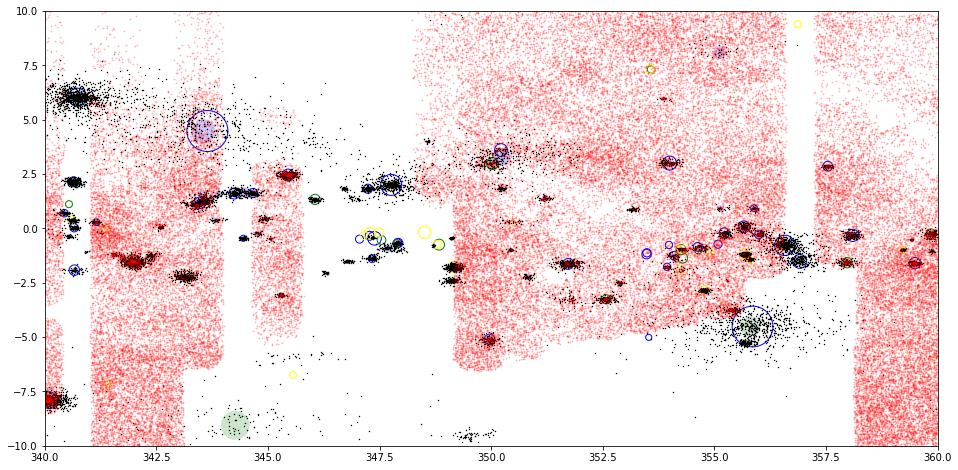

In [89]:
for i in np.arange(18):
    plt.figure(figsize=(4*4,4*2))
    plt.xlim(20*i,20*i+20) 
    plt.ylim(-10,10)
#sc=plt.scatter(bicaMWc.galactic.l.degree,bicaMWc.galactic.b.degree,marker='o',alpha=0.3,s=4*bicaDiam,facecolors='none', edgecolors='black')
#    sc=plt.scatter(bicaMWc.galactic.l.degree,bicaMWc.galactic.b.degree,marker='o',alpha=0.2,s=4*bicaDiam,color='black')

    sc=plt.scatter(liugl[liuyoung],liugb[liuyoung],marker='o',lw=1,s=4*liuDiam[liuyoung],facecolors='none',edgecolors='blue',alpha=1)
    sc=plt.scatter(liugl[liumed],liugb[liumed],marker='o',lw=1,s=4*liuDiam[liumed],facecolors='none',edgecolors='green',alpha=1)
    sc=plt.scatter(liugl[liuold],liugb[liuold],marker='o',lw=1,s=4*liuDiam[liuold],facecolors='none',edgecolors='yellow',alpha=1)

    sc=plt.scatter(cggl[cgyoung],cggb[cgyoung],marker='o',lw=0,s=4*cgDiam[cgyoung],color='blue',alpha=0.2)
    sc=plt.scatter(cggl[cgmed],cggb[cgmed],marker='o',lw=0,s=4*cgDiam[cgmed],color='green',alpha=0.2)
    sc=plt.scatter(cggl[cgold],cggb[cgold],marker='o',lw=0,s=4*cgDiam[cgold],color='yellow',alpha=0.2)


    sc=plt.scatter(cgsgl,cgsgb,marker='o',lw=0,s=2,color='black',alpha=1)
    sc=plt.scatter(gaiaASC['gl'],gaiaASC['gb'],marker='o',lw=0,s=3,color='red',alpha=0.3)
    #sc=plt.scatter(obcoord1.galactic.l.degree,obcoord1.galactic.b.degree,color='green',marker='o',s=2)
    #sc=plt.scatter(obcoord2.galactic.l.degree,obcoord2.galactic.b.degree,color='green',marker='o',s=2)
    plt.show()

In [37]:
hdu1=fits.open('/Scratch/UVGAPS/OBcat/stz1357_supplemental_tables/table2.fits')
obstar1=hdu1[1].data
print(obstar1.columns)
hdu2=fits.open('/Scratch/UVGAPS/OBcat/stz1357_supplemental_tables/table4.fits')
obstar2=hdu2[1].data
print(obstar2.columns)

ColDefs(
    name = 'ID'; format = 'J'
    name = 'RA'; format = 'D'
    name = 'DEC'; format = 'D'
    name = 'U'; format = 'E'
    name = 'UERR'; format = 'E'
    name = 'G'; format = 'E'
    name = 'GERR'; format = 'E'
    name = 'R'; format = 'E'
    name = 'RERR'; format = 'E'
    name = 'I'; format = 'E'
    name = 'IERR'; format = 'E'
    name = 'HA'; format = 'E'
    name = 'HAERR'; format = 'E'
    name = 'GAIAG'; format = 'E'
    name = 'GAIAGERR'; format = 'E'
    name = 'BP'; format = 'E'
    name = 'BPERR'; format = 'E'
    name = 'RP'; format = 'E'
    name = 'RPERR'; format = 'E'
    name = 'DIS'; format = 'E'
    name = 'PARA'; format = 'E'
    name = 'PARAERR'; format = 'E'
    name = 'PMRA'; format = 'E'
    name = 'PMRAERR'; format = 'E'
    name = 'PMDEC'; format = 'E'
    name = 'PMDECERR'; format = 'E'
    name = 'REF'; format = '28A'
)
ColDefs(
    name = 'RA'; format = 'D'
    name = 'DEC'; format = 'D'
    name = 'G'; format = 'E'
    name = 'GERR'; format = 'E

In [38]:
obcoord1 = SkyCoord(ra=obstar1['RA']*u.degree, dec=obstar1['DEC']*u.degree)  
print(obcoord1.galactic.l)
obcoord2 = SkyCoord(ra=obstar2['RA']*u.degree, dec=obstar2['DEC']*u.degree)  
print(obcoord2.galactic.l)
print(len(obcoord2.galactic.l.degree))
ptr1=np.where(np.abs(obcoord1.galactic.b.degree)<10)
obcoord1=obcoord1[ptr1]
dis1=obstar1['DIS'][ptr1]
ptr2=np.where(np.abs(obcoord2.galactic.b.degree)<10)
obcoord2=obcoord2[ptr2]
dis2=obstar2['DIS'][ptr2]
print(len(obcoord2.galactic.l.degree))


[212d39m44.4233s 213d08m40.9411s 213d27m47.5636s ... 36d19m02.8345s
 36d32m07.6408s 36d48m54.6402s]
[118d51m48.1067s 340d36m44.3913s 306d21m29.9396s ... 117d12m42.2414s
 116d44m52.8133s 116d49m24.9s]
8814
8259


In [85]:
from astropy.table import Table
t = Table.read('Table1_Machine_Readable_Zucker_2019.dat', format='ascii')
print(t.columns)
l_avg=(t['l_lower']+t['l_upper'])/2.0
b_avg=(t['b_lower']+t['b_upper'])/2.0
xcld=t['d_avg']*np.cos(np.pi*l_avg/180)/1000.0
ycld=t['d_avg']*np.sin(np.pi*l_avg/180)/1000.0
print(l_avg)

<TableColumns names=('name','l_lower','l_upper','b_lower','b_upper','ebv_thresh','d_avg','d_error_stat','d_error_sys')>
l_lower
-------
   38.0
  163.0
 145.75
 106.25
 106.25
  225.0
 219.25
  191.0
   44.5
   95.5
    ...
 195.75
   90.5
  159.5
  123.5
  207.0
  30.25
  171.0
  151.0
  299.0
  341.5
    0.5
Length = 27 rows


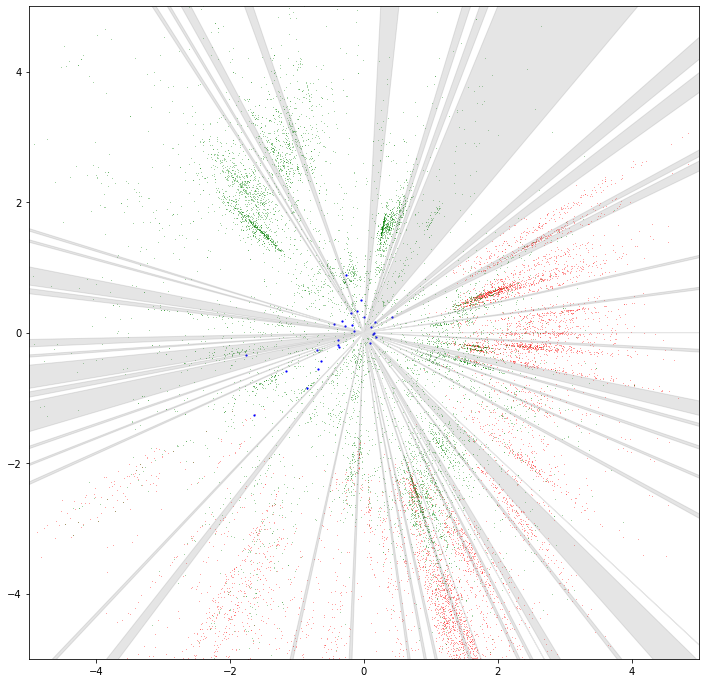

In [96]:
plt.figure(figsize=(4*3,4*3))
plt.xlim(-5,5) 
plt.ylim(-5,5)
xgal1=dis1*np.cos(obcoord1.galactic.l.radian)/1000.0
ygal1=dis1*np.sin(obcoord1.galactic.l.radian)/1000.0
xgal2=dis2*np.cos(obcoord2.galactic.l.radian)/1000.0
ygal2=dis2*np.sin(obcoord2.galactic.l.radian)/1000.0

sc=plt.scatter(xgal1,ygal1,alpha=1,marker='.',lw=0,s=1,color='red') 
sc=plt.scatter(xgal2,ygal2,alpha=1,marker='.',lw=0,s=1,color='green') 

sc=plt.scatter(xcld,ycld,alpha=1,marker='o',lw=0,s=5,color='blue')
plt.fill(xhist,yhist,alpha=0.2,color='gray')




In [97]:
idx1, d2d1, d3d1 = c.match_to_catalog_sky(obcoord1)  
idx2, d2d2, d3d2 = c.match_to_catalog_sky(obcoord2) 


2017
2802


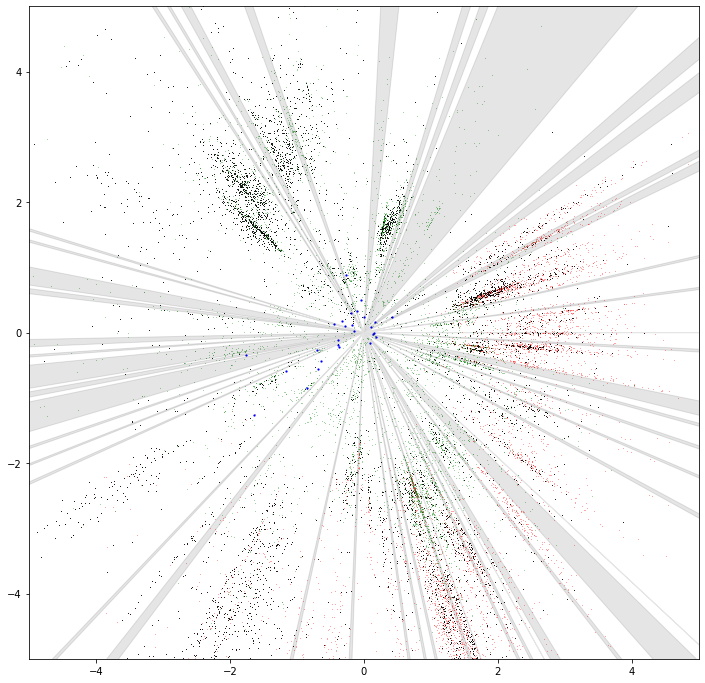

In [98]:
p1=np.where(d2d1.arcsec < 5)
p2=np.where(d2d2.arcsec < 5)

plt.figure(figsize=(4*3,4*3))
plt.xlim(-5,5) 
plt.ylim(-5,5)

sc=plt.scatter(xgal1,ygal1,alpha=1,marker='.',lw=0,s=1,color='red') 
sc=plt.scatter(xgal2,ygal2,alpha=1,marker='.',lw=0,s=1,color='green') 

sc=plt.scatter(xgal1[idx1[p1]],ygal1[idx1[p1]],alpha=1,marker='.',lw=0,s=3,color='black') 
sc=plt.scatter(xgal2[idx2[p2]],ygal2[idx2[p2]],alpha=1,marker='.',lw=0,s=3,color='black') 

print(len(xgal1[idx1[p1]]))
print(len(xgal2[idx2[p2]]))
sc=plt.scatter(xcld,ycld,alpha=1,marker='o',lw=0,s=5,color='blue')
plt.fill(xhist,yhist,alpha=0.1,color='black')


In [23]:
print(np.min(obcoord2.galactic.b.degree))

-78.32934899688784


In [ ]:
plt.figure(figsize=(4*3,4*2))
plt.xlim(-10,10) 
plt.ylim(-10,10)
xgal1=obstar1['DIS']*np.cos(obcoord1.galactic.l.radian)/1000.0
ygal1=obstar1['DIS']*np.sin(obcoord1.galactic.l.radian)/1000.0
xgal2=obstar2['DIS']*np.cos(obcoord2.galactic.l.radian)/1000.0
ygal2=obstar2['DIS']*np.sin(obcoord2.galactic.l.radian)/1000.0

sc=plt.scatter(xgal1,ygal1,alpha=1,marker='.',lw=0,s=1,color='red') 
sc=plt.scatter(xgal2,ygal2,alpha=1,marker='.',lw=0,s=1,color='green') 




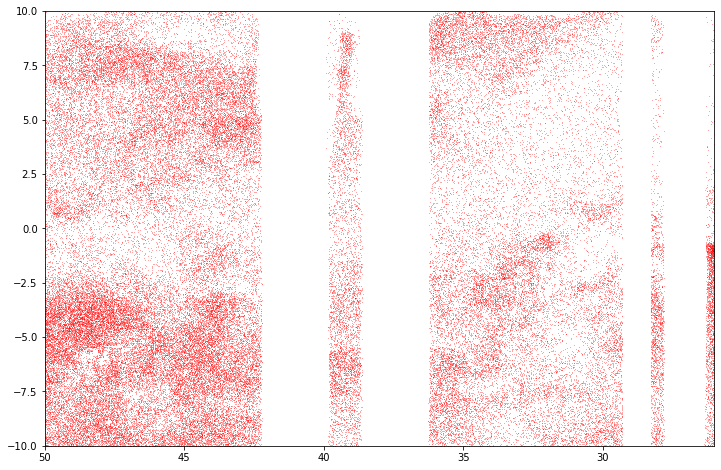

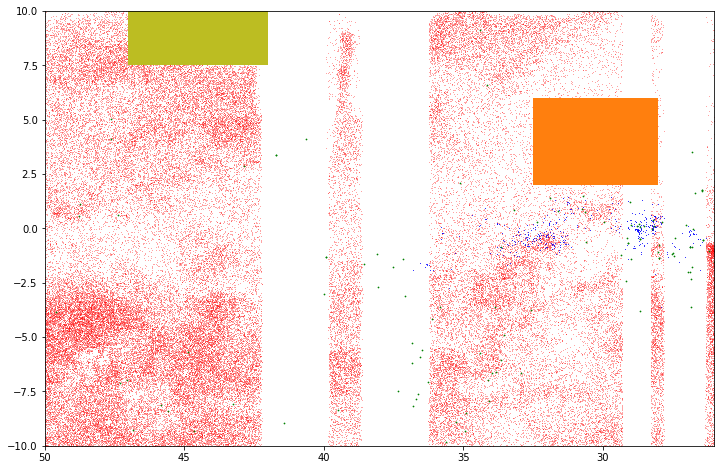

In [106]:
plt.figure(figsize=(4*3,4*2))
#plt.xlim(250,320) 
glmin=50
glmax=26
plt.xlim(glmin,glmax) 
plt.ylim(-10,10)
sc=plt.scatter(gaiaASC['gl'],gaiaASC['gb'],alpha=1,marker='.',lw=0,s=1,color='red') 
plt.figure(figsize=(4*3,4*2))
#plt.xlim(250,320) 
plt.xlim(glmin,glmax) 
plt.ylim(-10,10)
sc=plt.scatter(gaiaASC['gl'],gaiaASC['gb'],alpha=1,marker='.',lw=0,s=1,color='red') 
sc=plt.scatter(obcoord1.galactic.l,obcoord1.galactic.b,alpha=1,marker='o',lw=0,s=1,color='blue') 

sc=plt.scatter(obcoord2.galactic.l,obcoord2.galactic.b,alpha=1,marker='o',lw=0,s=3,color='green') 
for i in np.arange(len(t['l_lower'])):
    xcloudf=(t['l_lower'][i],t['l_lower'][i],t['l_upper'][i],t['l_upper'][i],t['l_lower'][i])
    ycloudf=(t['b_lower'][i],t['b_upper'][i],t['b_upper'][i],t['b_lower'][i],t['b_lower'][i])
    plt.fill(xcloudf,ycloudf)


In [27]:
p=np.where(d2d1.arcsec < 5)
print(d2d1[p].arcsec)
print(d2d1.shape)

[0.10669375 0.19118819 0.17573816 ... 0.05344282 0.05619259 0.02142858]
(2475257,)


<ipython-input-37-f584a3b305c4>:8: RuntimeWarning: invalid value encountered in greater
  p1=np.where((d2d1.arcsec < 5) & (ebv > 0))
<ipython-input-37-f584a3b305c4>:10: RuntimeWarning: invalid value encountered in greater
  p2=np.where((d2d2.arcsec < 5) & (ebv > 0))


(894,) (2174,)


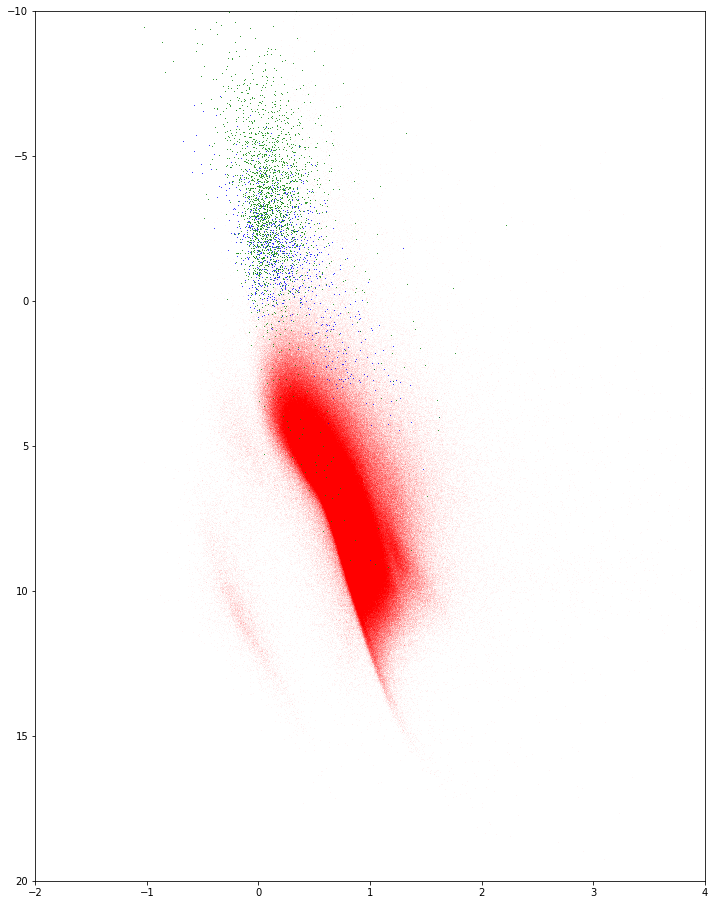

In [37]:
plt.figure(figsize=(4*3,4*4))
plt.xlim(-2,4) 
plt.ylim(20,-10)
bpmrp=gaiaASC['phot_bp_mean_mag']-gaiaASC['phot_rp_mean_mag']
mnuv=gaiaASC['nuv']-gaiaASC['distmod']
ebv=gaiaASC['ebv']
sc=plt.scatter(bpmrp,mnuv,alpha=.1,marker='.',lw=0,s=1,color='red') 
p1=np.where((d2d1.arcsec < 5) & (ebv > 0))
sc=plt.scatter(bpmrp[p1]-ebv[p1],mnuv[p1]-(8*ebv[p1]),alpha=1,marker='o',lw=0,s=1,color='blue') 
p2=np.where((d2d2.arcsec < 5) & (ebv > 0))
sc=plt.scatter(bpmrp[p2]-ebv[p2],mnuv[p2]-(8*ebv[p2]),alpha=1,marker='o',lw=0,s=1,color='green') 

print(mnuv[p1].shape,mnuv[p2].shape)


In [34]:
p=np.where((d2d1.arcsec < 5) & (gaiaASC['ebv'] > 0))
print(gaiaASC['ebv'][p])



[0.447056   0.46790689 0.51996422 0.65253198 0.26672256 0.39487016
 0.51640713 0.49997574 0.29671255 0.51820713 0.64278209 0.83786327
 0.74096572 0.46813267 0.26614746 0.96498311 0.9604919  0.55810559
 0.51427674 0.5485059  0.67852569 0.53547752 0.38155198 0.6906395
 0.65700674 0.29217541 0.52953327 0.49921066 0.39994127 0.76394165
 0.65638262 0.58020186 0.55240059 0.53699529 0.76966882 0.38423276
 0.90309286 0.51107043 0.40453282 0.43531173 0.54447353 0.63364667
 0.55199295 0.6991508  0.7603209  0.39992046 0.36932451 0.49036458
 0.35563606 0.44950897 0.52382267 0.45216691 0.60225737 0.40750295
 0.41378808 0.3257677  0.2916072  0.48021692 0.50535572 0.36324313
 0.3741253  0.33496642 0.57818174 0.35289422 0.44567132 0.56514639
 0.38770306 0.50762904 0.64037549 0.34954172 0.37370366 0.24510643
 0.46450317 0.56313384 0.48717919 0.35961625 0.33970964 0.58436143
 0.41422391 0.49408114 0.44520265 0.48937631 0.67491639 0.41761667
 0.60075426 0.34980553 0.46009469 0.53159314 0.45120388 0.57229

<ipython-input-34-0cbeab6e9f5c>:1: RuntimeWarning: invalid value encountered in greater
  p=np.where((d2d1.arcsec < 5) & (gaiaASC['ebv'] > 0))
